# Tarea N°01

## Instrucciones

1.- Completa tus datos personales (nombre y rol USM) en siguiente celda.


* __Nombre__: Alvaro Aravena

* __Rol__: 201511568-0

2.- Debes _pushear_ este archivo con tus cambios a tu repositorio personal del curso, incluyendo datos, imágenes, scripts, etc.

3.- Se evaluará:
    - Soluciones
    - Código
    - Que Binder esté bien configurado.
    - Al presionar  `Kernel -> Restart Kernel and Run All Cells` deben ejecutarse todas las celdas sin error.

## I.-  Imagenception

Desde [Wikipedia](https://es.wikipedia.org/wiki/RGB), __RGB__ (sigla en inglés de red, green, blue) es un modelo de color basado en la síntesis aditiva, con el que es posible representar un color mediante la mezcla por adición de los tres colores de luz primarios. El modelo de color RGB no define por sí mismo lo que significa exactamente rojo, verde o azul, por lo que los mismos valores RGB pueden mostrar colores notablemente diferentes en distintos dispositivos que usen este modelo de color. Aunque utilicen un mismo modelo de color, sus espacios de color pueden variar considerablemente.

Para indicar con qué proporción es mezclado cada color, se asigna un valor a cada uno de los colores primarios, de manera que el valor "0" significa que no interviene en la mezcla y, a medida que ese valor aumenta, se entiende que aporta más intensidad a la mezcla. Aunque el intervalo de valores podría ser cualquiera (valores reales entre 0 y 1, valores enteros entre 0 y 37, etc.), es frecuente que cada color primario se codifique con un byte (8 bits).

Así, de manera usual, la intensidad de cada una de las componentes se mide según una escala que va del 0 al 255 y cada color es definido por un conjunto de valores escritos entre paréntesis (correspondientes a valores "R", "G" y "B") y separados por comas.

El conjunto de todos los colores también se puede representar en forma de cubo. Cada color es un punto de la superficie o del interior de éste. La escala de grises estaría situada en la diagonal que une al color blanco con el negro.

![rgb](https://upload.wikimedia.org/wikipedia/commons/thumb/a/a9/Avl3119color4a.svg/800px-Avl3119color4a.svg.png)

Para efectos prácticos del curso, es posible representar cada pixel de una imagen con un array de 3 dimensiones, cada valor representa a una de las capas RGB. Por lo tanto, una imagen de $n \times m$ pixeles se representa como un arreglo de dimension $(n, m , 3)$ En `Python` una de las librerías de procesamiento de imágenes más utilizada es `Pillow`.

Abrir una imagen es tan fácil como:

In [1]:
# librerias

import os
import numpy as np
from PIL import Image

In [2]:
gatito = Image.open(os.path.join("images", "gatito.png"))

Notar que la variable anterior es de una clase específica de la librería.

In [3]:
type(gatito)

PIL.PngImagePlugin.PngImageFile

Para ver la imagen en Jupyter puedes utilizar la misma técnica que con los `pd.DataFrames`, es decir:

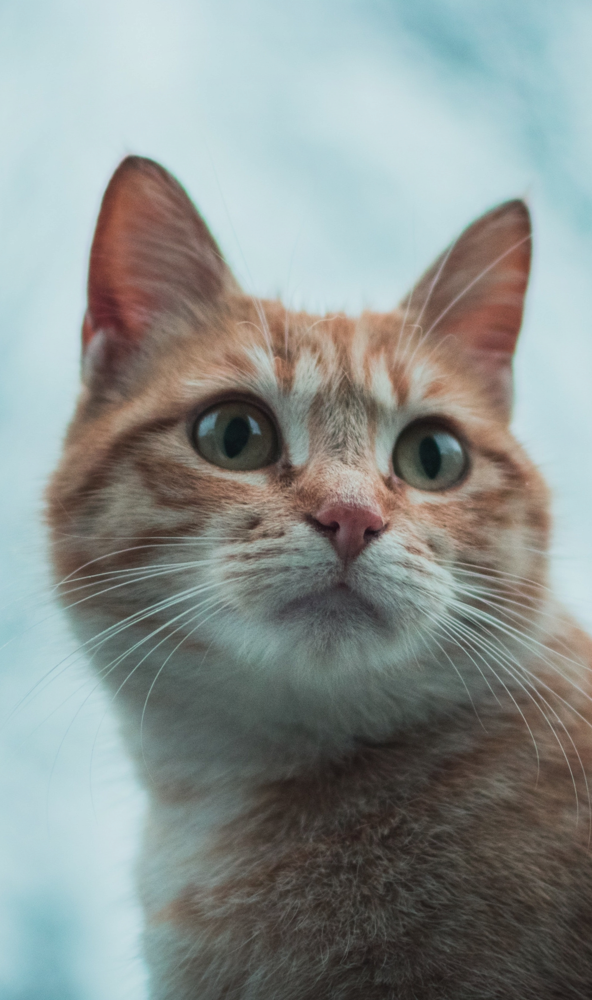

In [4]:
gatito

Para tener su representación en un array podemos utilizar el constructor `np.array` con argumento la imagen.

In [5]:
gatito_np = np.array(gatito)
print(f"Dimension de la imagen gatito: {gatito_np.shape}.\n")
print(f"Al convertir a np.ndarry el tipo de elementos es {gatito_np.dtype}.\n")
print(gatito_np)

Dimension de la imagen gatito: (2160, 1280, 3).

Al convertir a np.ndarry el tipo de elementos es uint8.

[[[179 211 215]
  [179 211 215]
  [179 209 215]
  ...
  [171 201 209]
  [171 201 209]
  [169 199 207]]

 [[181 213 217]
  [181 213 217]
  [181 211 217]
  ...
  [173 203 211]
  [173 203 211]
  [171 201 209]]

 [[179 211 215]
  [179 211 215]
  [181 211 217]
  ...
  [173 203 211]
  [173 203 211]
  [173 203 211]]

 ...

 [[125 179 190]
  [123 177 188]
  [129 183 194]
  ...
  [ 41  36  33]
  [ 43  38  35]
  [ 45  40  37]]

 [[127 181 192]
  [125 179 190]
  [127 181 192]
  ...
  [ 43  38  37]
  [ 43  38  37]
  [ 45  40  37]]

 [[125 179 190]
  [123 177 188]
  [123 177 188]
  ...
  [ 49  44  43]
  [ 45  40  37]
  [ 43  38  35]]]


### 1.- Encontrando la imagen oculta

La imagen anterior tiene una imagen oculta, el ejercicio corresponde en descifrarlo. Las instrucciones son las siguientes:

1.1 Crear una lista vacía declarada como `secret_list`.

In [6]:
secret_list = [] #creo la lista secret list, dado que no conozco las dimenciones lo defino como []

1.2 Iterar por cada uno de los canales RGB (`gatito_np.shape[2]`) y en cada iteración:
 * Crear un arreglo temporal llamado `secret_aux` de dos dimensiones, de la misma dimension de pixeles de la imagen `gatito` y que tenga valores enteros, `0` si el valor de la capa de `gatito_np` es par y `1` si es impar. 
  - No iterar por filas y columnas.
  - Utilizar la operación módulo `%`. 
  - En la i-ésima iteración de los canales la capa de `gatito_np` es `gatito_np[:, :, i]`.
        
        
 * Escalar `secret_aux` a valores 0 y 255.
    
 * Cambiar el `dtype` de `secret_aux` a `np.uint8` (utilize el méteodo `astype()`).
            
 * Agregue `secret_aux` a `secret_list`.
    
Al final de la iteración `secret_list` debe tener solo tres arreglos.

**Observación:** recuerde que puede aplicar operaciones directo a un arreglo de numpy.

In [7]:
secret_aux=np.zeros((gatito_np.shape[0],gatito_np.shape[1])) #ahora que se las dimensiones, creo un array de las dimensiones de la foto
for channel in range(gatito_np.shape[2]): #recorro cada canal RGB
    secret_aux = gatito_np[:, :,channel]%2 #obtengo si el número es pas o impar y lo guardo en secret_aux
    secret_aux = secret_aux*255 #escalo secret_aux entre valores 0 y 255 (dado que sólo puede ser 0 o 1, lo multiplico por 255) 
    secret_aux = secret_aux.astype('uint8') #cambio el tipo de dato
    secret_list.append(secret_aux) #añado secret_aux a secret_list 

In [8]:
print(f"secret_list tiene {len(secret_list)} elementos") #se obtiene el número de elementos de secret_list

secret_list tiene 3 elementos


1.3 Crear la variable `secret_np` concatenando horizontalmente los elementos de `secret_list`.

In [9]:
#concateno los elementos de secret_list en una misma dimension (horizontal)
secret_np=np.concatenate([secret_list[0],secret_list[1],secret_list[2]], axis = 1) 

1.4 Crear el objeto `secret_img` utilizando el arreglo `secret_np`, asegurar que los valores estén entre 0 y 255, y que el dtype sea `np.uint8`, con el método `Image.fromarray` con argumento `mode="L"`

In [10]:
np.unique(secret_np) #se observa si los valores están efectivamente entre 0 y 255

array([  0, 255], dtype=uint8)

In [11]:
secret_np.dtype #se comprueba el tipo de dato

dtype('uint8')

In [12]:
secret_img = Image.fromarray(secret_np,mode="L") #se crea la imagen final

Ahora puedes ver el resultado!

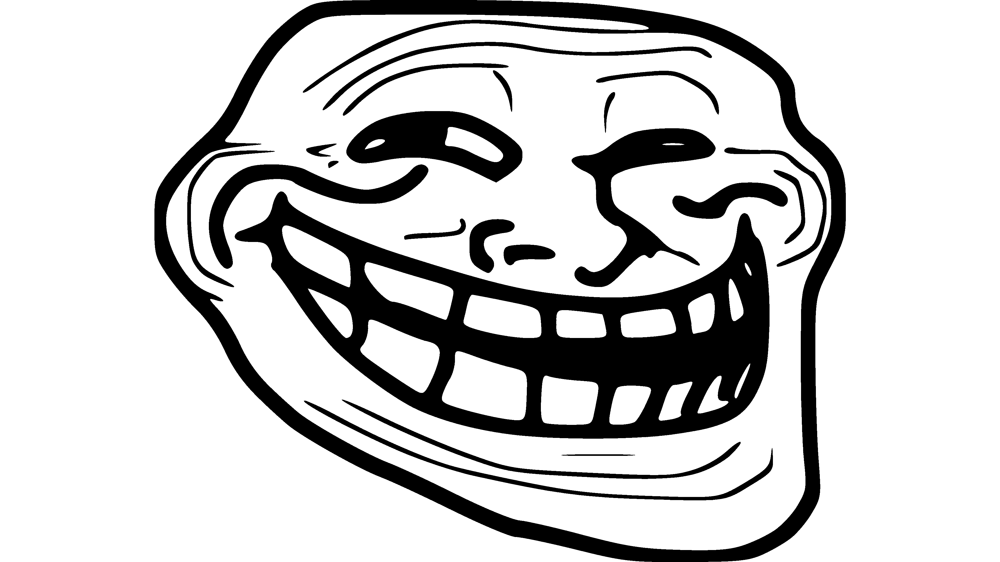

In [13]:
secret_img
#XD

### 2.- Escondiendo una nueva imagen

Es tu turno, ahora tu esconderás una imagen. Las instrucciones son las siguientes:

2.1 Selecciona una imagen de 2160 x 3840 pixeles (a.k.a resolución 4k), lo importante es que sea solo en blanco y negro, en la carpeta `images` se disponibiliza como ejemplo la imagen `black_and_white_example.jpg` y crea una variable llamada `my_img` leyendo la imagen seleccionada con `Image.open()`.

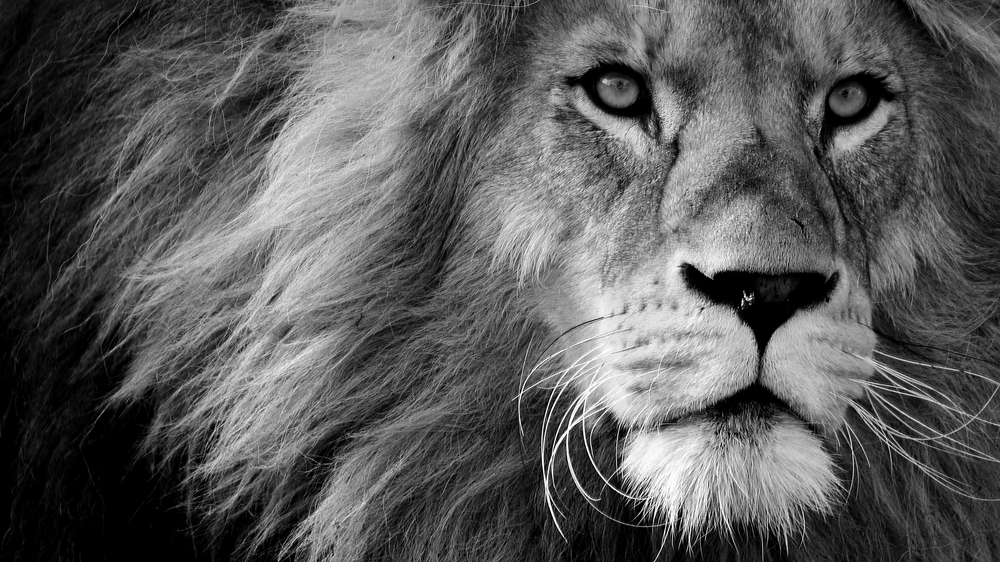

In [14]:
my_img = Image.open(os.path.join("images", "Lions_Glance_Snout_Black_and_white_552727_3840x2160.jpg")) #añado una imagen propia
my_img

2.2 Crea un arreglo llamado `my_img_np` utilizando `my_img` y el método `np.array()`.
    * Es importante que `my_img_np.shape` sea `(2160, 3840)`, es decir, que solo sea de dos dimensiones. Esto porque es una imagen en blanco y negro, no necesitando el modelo RGB.

In [15]:
my_img_np = np.array(my_img) #convierto la imagen a array
print(my_img_np.shape) #compruebo el tamaño de la imagen


(2160, 3840)


2.3 Crear la variable `my_img_np_aux` utilizando un _umbral_ con tal de que:
    - 1: Si el valor del pixel es mayor  al _umbral_.
    - 0: Si el valor del pixel es menor o igual al _umbral_.
    - El `dtype` debe ser `np.uint8`.
    - Para `black_and_white_example.jpg` un umbral adecuado es `20`.

In [16]:
umbral = 120 #creo un umbral acorde a mi fotografia, de modo que se entienda
my_img_np_aux =np.greater(my_img_np,umbral) #obtengo qué valores son mayores que mi umbral, hay que notar que el resultado de esto es un array con valores lógicos (True o False)
my_img_np_aux=my_img_np_aux.astype('uint8') #convierto los valores lógicos a 0 y 1 y a formato uint8


Puedes probar que tan bien quedó la imagen con la siguiente linea. Si crees que no se ve bien, puedes cambiar el _umbral_.

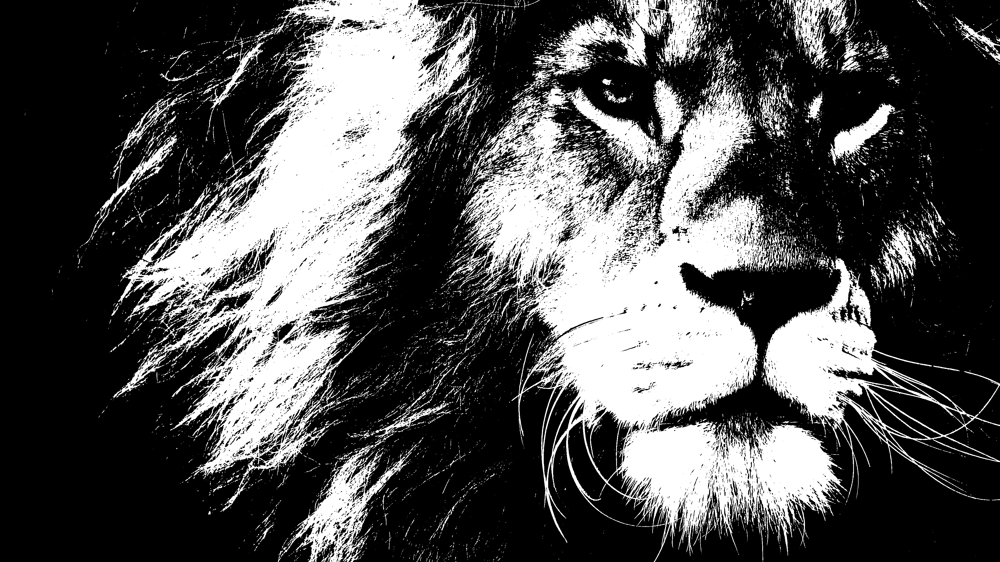

In [17]:
Image.fromarray(my_img_np_aux * 255) #tengo una vista previa de la imagen

2.4 Dividir la imagen en tres arreglos de tamaño (2160, 1280) y guardarlos en una lista con el nombre `my_img_split`. Hint: Revisa en la documentación de `numpy`.

In [18]:
my_img_split = np.hsplit(my_img_np_aux, 3) #divido mi imagen en 3 arreglos
print(f'el numero de arrelos es: {len(my_img_split)}')
print(f'cada arreglo tiene dimensión: {my_img_split[0].shape}')

el numero de arrelos es: 3
cada arreglo tiene dimensión: (2160, 1280)


Revisa utilizando la siguiente iteración.

In [19]:
for img_array in my_img_split:
    print(img_array.shape)

(2160, 1280)
(2160, 1280)
(2160, 1280)


2.5 La imagen donde se esconderá tu imagen selecionada está en la carpeta `images` con el nombre `gatito_original.png`, que sospechosamente es de 2160 x 1280 pixeles. Carga la imagen en la variable `cat` y luego crea arreglo `cat_np` utilizando `cat`. Verifica que `cat_np.shape = (2160, 1280, 3)`.

In [20]:
cat = Image.open(os.path.join("images", "gatito_original.png"))
cat_np = np.array(cat)
print(cat_np.shape)

(2160, 1280, 3)


2.6 Convierte todos los valores de `cat_np` a valores pares. Esto lo puedes hacer sumando 1 a cada valor de arreglo si es impar

In [21]:
cat_np+=cat_np[:,:,:]%2
print(cat_np.shape)
np.unique(cat_np)

(2160, 1280, 3)


array([  6,   8,  10,  12,  14,  16,  18,  20,  22,  24,  26,  28,  30,
        32,  34,  36,  38,  40,  42,  44,  46,  48,  50,  52,  54,  56,
        58,  60,  62,  64,  66,  68,  70,  72,  74,  76,  78,  80,  82,
        84,  86,  88,  90,  92,  94,  96,  98, 100, 102, 104, 106, 108,
       110, 112, 114, 116, 118, 120, 122, 124, 126, 128, 130, 132, 134,
       136, 138, 140, 142, 144, 146, 148, 150, 152, 154, 156, 158, 160,
       162, 164, 166, 168, 170, 172, 174, 176, 178, 180, 182, 184, 186,
       188, 190, 192, 194, 196, 198, 200, 202, 204, 206, 208, 210, 212,
       214, 216, 218, 220, 222, 224, 226, 228, 230, 232], dtype=uint8)

2.7 Itera por canal RGB de `cat_np` y en cada capa suma los valores de uno de los arreglos de `my_img_split`.

In [22]:
for channel in range(cat_np.shape[2]):
    cat_np[:,:,channel] += my_img_split[channel]

2.8 Crea una variable llamada `cat_secret_im` con `Image.fromarray` y la variable `cat_np` (que ya ha sido modificada). Luego guarda la imagen en la carpeta `images` con el nombre `my_secret.png`.

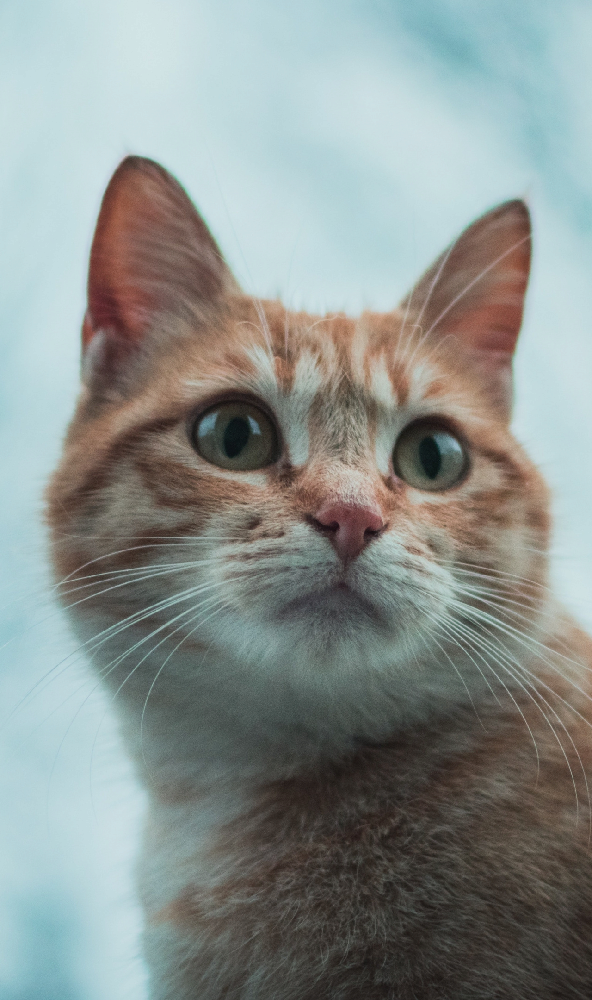

In [23]:
cat_secret_im = Image.fromarray(cat_np)
cat_secret_im.save(os.path.join("images","my_secret.png"))
cat_secret_im

2.9 Crea una función llamada `imagenception()` que como argumento tenga la ruta de la imagen que quieres descifrar y que descifre la imagen secreta recientemente creada. Hint: Utiliza todos los pasos de la primera parte. 

In [24]:
def imagenception(filepath):
    foto= Image.open(filepath)
    foto_np=np.array(foto)
    secret_list = [] #creo la lista secret list, dado que no conozco las dimenciones lo defino como []
    secret_aux=np.zeros((foto_np.shape[0],foto_np.shape[1])) #ahora que se las dimensiones, creo un array de las dimensiones de la foto
    for channel in range(foto_np.shape[2]): #recorro cada canal RGB
        secret_aux = foto_np[:, :,channel]%2 #obtengo si el número es pas o impar y lo guardo en secret_aux
        secret_aux = secret_aux*255 #escalo secret_aux entre valores 0 y 255 (dado que sólo puede ser 0 o 1, lo multiplico por 255) 
        secret_aux = secret_aux.astype('uint8') #cambio el tipo de dato
        secret_list.append(secret_aux) #añado secret_aux a secret_list 
    #concateno los elementos de secret_list en una misma dimension (horizontal)
    secret_np=np.concatenate([secret_list[0],secret_list[1],secret_list[2]], axis = 1)
    secret_img = Image.fromarray(secret_np,mode="L") #se crea la imagen final
    return secret_img

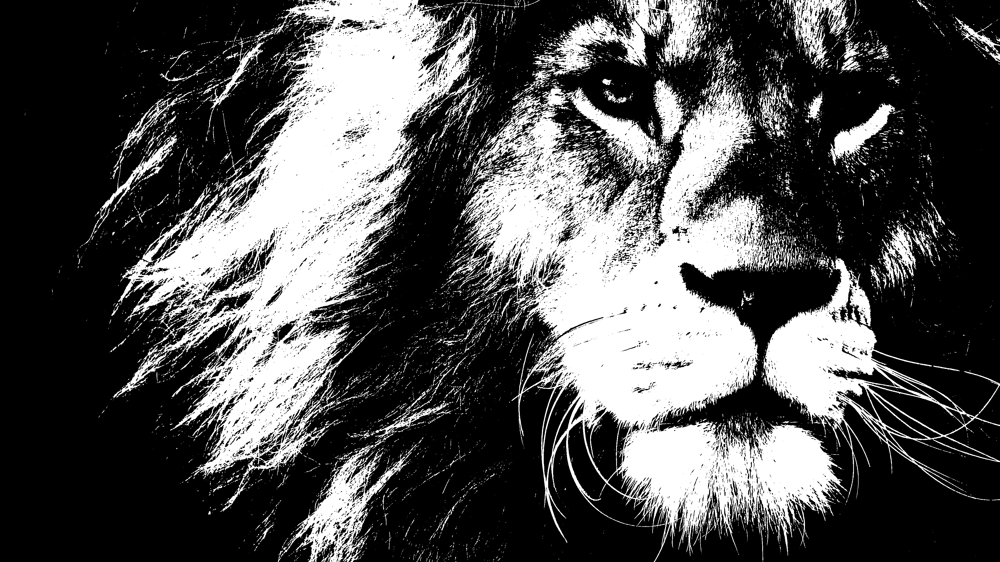

In [25]:
my_secret_img = imagenception(os.path.join("images", "my_secret.png"))
my_secret_img

## II.- Analizando la Felicidad

<img src="https://static01.nyt.com/images/2019/09/29/opinion/sunday/29HolsonStill/29HolsonStill-popup.jpg" width="480" height="360" align="center"/>

Este ejercicio es netamente análisis de datos, tratando de abarcar problemas típicos como la lectura de datos, corrección de errores, métricas agrupadas, unión de datos, etc. Utilizaremos un conjunto de datos llamado __World Happiness Report__ disponible en el siguiente [link](https://www.kaggle.com/unsdsn/world-happiness), de donde se puede obtener información al respecto.

#### Context
The World Happiness Report is a landmark survey of the state of global happiness. The first report was published in 2012, the second in 2013, the third in 2015, and the fourth in the 2016 Update. The World Happiness 2017, which ranks 155 countries by their happiness levels, was released at the United Nations at an event celebrating International Day of Happiness on March 20th. The report continues to gain global recognition as governments, organizations and civil society increasingly use happiness indicators to inform their policy-making decisions. Leading experts across fields – economics, psychology, survey analysis, national statistics, health, public policy and more – describe how measurements of well-being can be used effectively to assess the progress of nations. The reports review the state of happiness in the world today and show how the new science of happiness explains personal and national variations in happiness.

#### Content
The happiness scores and rankings use data from the Gallup World Poll. The scores are based on answers to the main life evaluation question asked in the poll. This question, known as the Cantril ladder, asks respondents to think of a ladder with the best possible life for them being a 10 and the worst possible life being a 0 and to rate their own current lives on that scale. The scores are from nationally representative samples for the years 2013-2016 and use the Gallup weights to make the estimates representative. The columns following the happiness score estimate the extent to which each of six factors – economic production, social support, life expectancy, freedom, absence of corruption, and generosity – contribute to making life evaluations higher in each country than they are in Dystopia, a hypothetical country that has values equal to the world’s lowest national averages for each of the six factors. They have no impact on the total score reported for each country, but they do explain why some countries rank higher than others.


### 2.1 Lectura de datos

In [26]:
# libraries
import os
import pandas as pd
pd.set_option("display.max_columns", 999)  # Permite mostrar hasta 999 columnas de un DataFrame en Jupyter.

En la carpeta `data/world-happiness` se disponen de tres archivos, uno por cada reporte anual (años 2015, 2016 y 2017). No es de sorprender que envíen un archivo por año (podría ser mensual, semestral, etc.), lo imortante es ser capaces de leer una cantidad __variable__ de archivos al mismo tiempo. Una buena práctica es crear un diccionario de dataframes.

In [27]:
# Comprehension dictionary
df_dict = {
    year: pd.read_csv(os.path.join("data", "world-happiness", f"{year}.csv"))
    for year in [2015, 2016, 2017]
}

Por ejemplo, se puede acceder al DataFrame asociado al archivo `data/world-happiness/2016.csv` de la siguiente manera:

In [28]:
df_dict[2016].head()


,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Denmark,Western Europe,1,7.526,7.460,7.592,1.44178,1.16374,0.79504,0.57941,0.44453,0.36171,2.73939
1,Switzerland,Western Europe,2,7.509,7.428,7.590,1.52733,1.14524,0.86303,0.58557,0.41203,0.28083,2.69463
2,Iceland,Western Europe,3,7.501,7.333,7.669,1.42666,1.18326,0.86733,0.56624,0.14975,0.47678,2.83137
3,Norway,Western Europe,4,7.498,7.421,7.575,1.57744,1.12690,0.79579,0.59609,0.35776,0.37895,2.66465
4,Finland,Western Europe,5,7.413,7.351,7.475,1.40598,1.13464,0.81091,0.57104,0.41004,0.25492,2.82596


Una pequeña descripción de las columnas

* `Country` Name of the country.
* `Region` Region the country belongs to.
* `Happiness Rank` Rank of the country based on the Happiness Score.
* `Happiness Score` A metric measured in 2015 by asking the sampled people the question: "How would you rate your happiness on a scale of 0 to 10 where 10 is the happiest."
* `Standard Error` The standard error of the happiness score.
* `Economy (GDP per Capita)` The extent to which GDP contributes to the calculation of the Happiness Score.
* `Family` The extent to which Family contributes to the calculation of the Happiness Score
* `Health (Life Expectancy)` The extent to which Life expectancy contributed to the calculation of the Happiness Score
* `Freedom` The extent to which Freedom contributed to the calculation of the Happiness Score.
* `Trust (Government Corruption)` The extent to which Perception of Corruption contributes to Happiness Score.
* `Generosity` The extent to which Generosity contributed to the calculation of the Happiness Score.
* `Dystopia Residual` The extent to which Dystopia Residual contributed to the calculation of the Happiness Score.

Notar que los conjuntos de datos no poseen las mismas columnas, por lo tanto, solo se trabajarán con las columnas en común y posteriormente agregaremos el año con tal de concatenar los tres conjuntos.

In [29]:
from functools import reduce
intersection_columns = reduce(np.intersect1d, [df_i.columns.values for df_i in df_dict.values()]).tolist() + ["Year"]
print(intersection_columns)

['Country', 'Dystopia Residual', 'Economy (GDP per Capita)', 'Family', 'Freedom', 'Generosity', 'Happiness Rank', 'Happiness Score', 'Health (Life Expectancy)', 'Trust (Government Corruption)', 'Year']


Explica con tus palabras las operaciones que se realizaron para obtener la variable `intersection_columns`.

__Respuesta:__  

1. El comando reduce() itera una función hasta el último valor posible, por lo que se utiliza en este caso dado que se tienen que comparar 3 años. 


2. para comparar la intersección de las columnas se utiliza el comando intersect1d(), que sirve para intersectar los valores que hay en varios arrays.


3. En este caso, hay un for dentro de reduce().Su función es obtener los nombres de las columnas en los 3 años (con la variable df_i toma toda la tabla del año i, y la variable df_i.columns.values obtiene los nombres de las columnas)


4. Ahora que se tienen 3 arrays con los nombres de las columnas, se intersectan los nombres de las columnas entre los 3 años, con el comando tolist() se genera una lista.


5. Se le añade la columna "year"

### 2.2 Concatenación y procesado

Define el DataFrame `happiness` tal que:

* Sea la concatenación de los dataframes de `df_dict`
    - Nota que en la documentación de `pd.concat` puedes entregar como argumento directamente un diccionario.
    - No ordenes los _axis_ (ver documentación).
    - Los nombres de los _levels_ para los multi-index resultante deben ser `["Year", "drop_me"]`.
* Aplica el método `drop_level` con tal de eliminar el nivel del multi-index llamado `drop_me`.
* Resetea los índices.
* Selecciona solo las columnas de la lista `intersection_columns`.
* Los nombres de las columnas deben estar en minísculas, reemplazar espacios por guiones bajos (`_`) y elimina los paréntesis.


In [30]:
happiness = (
    pd.concat(df_dict,names=["Year", "drop_me"])
    .droplevel("drop_me")
    .reset_index()
    .loc[:,intersection_columns]
    .rename(columns=lambda x: x.lower().replace('(','').replace(')','').replace(' ','_')) ## FIX ME ##
)
happiness.head()

#el comando rename renombra las columnas, el comando replace reemplaza.

,country,dystopia_residual,economy_gdp_per_capita,family,freedom,generosity,happiness_rank,happiness_score,health_life_expectancy,trust_government_corruption,year
0,Switzerland,2.51738,1.39651,1.34951,0.66557,0.29678,1,7.587,0.94143,0.41978,2015
1,Iceland,2.70201,1.30232,1.40223,0.62877,0.43630,2,7.561,0.94784,0.14145,2015
2,Denmark,2.49204,1.32548,1.36058,0.64938,0.34139,3,7.527,0.87464,0.48357,2015
3,Norway,2.46531,1.45900,1.33095,0.66973,0.34699,4,7.522,0.88521,0.36503,2015
4,Canada,2.45176,1.32629,1.32261,0.63297,0.45811,5,7.427,0.90563,0.32957,2015


### 2.3 Análisis

Como siempre, partimos con un análisis descriptivo simple.

In [31]:
happiness.describe(include="all").fillna("").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
country,470,166,Kazakhstan,3,,,,,,,
dystopia_residual,470.0,,,,2.092717,0.565772,0.32858,1.737975,2.09464,2.455575,3.83772
economy_gdp_per_capita,470.0,,,,0.92783,0.415584,0.0,0.605292,0.995439,1.252443,1.870766
family,470.0,,,,0.990347,0.318707,0.0,0.793,1.025665,1.228745,1.610574
freedom,470.0,,,,0.402828,0.150356,0.0,0.297615,0.418347,0.51685,0.66973
generosity,470.0,,,,0.242241,0.131543,0.0,0.152831,0.22314,0.315824,0.838075
happiness_rank,470.0,,,,78.829787,45.281408,1.0,40.0,79.0,118.0,158.0
happiness_score,470.0,,,,5.370728,1.136998,2.693,4.509,5.2825,6.23375,7.587
health_life_expectancy,470.0,,,,0.579968,0.240161,0.0,0.402301,0.630053,0.768298,1.02525
trust_government_corruption,470.0,,,,0.13479,0.111313,0.0,0.059777,0.099502,0.173161,0.55191


¿Cuántos países no tienen mediciones de felicidad en los tres años del estudio? ¿Cuáles son?

__Respuesta:__  para encontrar qué países no tienen estudios, busco en cuales algún parámetro es cero:

In [32]:
print((happiness==0).sum()) #el resultado de (happiness==0) es una lista con los datos que son 0, 
#y el comando .sum() me muestra cuántos son en total. 


country                        0
dystopia_residual              0
economy_gdp_per_capita         3
family                         3
freedom                        3
generosity                     3
happiness_rank                 0
happiness_score                0
health_life_expectancy         3
trust_government_corruption    3
year                           0
dtype: int64


__Respuesta:__  Para entontrar qué países son los que no tienen, se debe seleccionar cada uno de los parámetros que contienen un 0. Entendí que me pedían qué países no tienen estudios en almenos uno de los 3 años (otra forma de decirlo, si un país no tiene estudio en sólo 1 año, igual se considerará en este caso, no necesariamente que no tengan estudios en los 3 años): 

In [33]:
a=(happiness['freedom']==0)#busco qué países tienen Freedom=0
b1=np.where(a)#obtengo la posición del país

a=(happiness['economy_gdp_per_capita']==0)#busco qué países tienen economy_gdp_per_capita=0
b2=np.where(a)#obtengo la posición del país

a=(happiness['family']==0)#busco qué países tienen family=0
b3=np.where(a)#obtengo la posición del país

a=(happiness['generosity']==0)#busco qué países tienen generosity=0
b4=np.where(a)#obtengo la posición del país

a=(happiness['health_life_expectancy']==0)#busco qué países tienen health_life_expectancy=0
b5=np.where(a)#obtengo la posición del país

a=(happiness['trust_government_corruption']==0)#busco qué países tienen trust_government_corruption=0
b6=np.where(a)#obtengo la posición del país

arr = np.hstack((b1, b2,b3,b4,b5,b6))#uno todos los países encontrados en una misma array
arr=arr[0].tolist()#transformo la array en lista para poder buscar las posiciones en happiness
print(arr)#imprimo las posiciones encontradas

[111, 290, 454, 119, 233, 469, 147, 312, 469, 101, 256, 401, 122, 268, 453, 73, 244, 404]


__Respuesta:__  Una vez encontrado las posiciones de los países, procedo a mostrar qué países son:

In [34]:
happiness.iloc[arr] #con esto imprimo en pantalla qué países tienen al menos un parámetro en 0 en algun de los 3 años.

,country,dystopia_residual,economy_gdp_per_capita,family,freedom,generosity,happiness_rank,happiness_score,health_life_expectancy,trust_government_corruption,year
111,Iraq,1.953350,0.985490,0.818890,0.000000,0.179220,112,4.677,0.602370,0.137880,2015
290,Sudan,2.109950,0.630690,0.819280,0.000000,0.180770,133,4.139,0.297590,0.100390,2016
454,Angola,1.614482,0.858428,1.104412,0.000000,0.097926,140,3.795,0.049869,0.069720,2017
119,Congo (Kinshasa),2.867120,0.000000,1.001200,0.226050,0.248340,120,4.517,0.098060,0.076250,2015
233,Somalia,3.837720,0.000000,0.336130,0.567780,0.272250,76,5.440,0.114660,0.311800,2016
469,Central African Republic,2.066005,0.000000,0.000000,0.270842,0.280876,155,2.693,0.018773,0.056565,2017
147,Central African Republic,2.722300,0.078500,0.000000,0.488790,0.238350,148,3.678,0.066990,0.082890,2015
312,Togo,2.135400,0.281230,0.000000,0.346780,0.175170,155,3.303,0.248110,0.115870,2016
469,Central African Republic,2.066005,0.000000,0.000000,0.270842,0.280876,155,2.693,0.018773,0.056565,2017
101,Greece,1.801010,1.154060,0.929330,0.076990,0.000000,102,4.857,0.882130,0.013970,2015


__Respuesta:__  se nota que hay países repetidos, es por esto que sólo dejo los países únicos:

In [35]:
pd.DataFrame(happiness.iloc[arr]["country"].unique(),columns=["country"])
#utilizo el comando unique() para seleccionar los países únicos, para una mejor representación convierto el 
#resultado en dataframe

,country
0,Iraq
1,Sudan
2,Angola
3,Congo (Kinshasa)
4,Somalia
5,Central African Republic
6,Togo
7,Greece
8,Sierra Leone
9,Lesotho


__Respuesta:__ se observa que son 12 países que no tienen estudios en los 3 años

__Respuesta:__ Otra forma de entenderlo, es qué países no tienen 3 años seguidos de estudios, eso se averigua a continuación:

In [36]:
c=happiness.groupby(["country"])["year"].count() #agrupo los datos por país, y los cuento por año de estudio
a=(c!=3) #obtengo todos los países cuyos estudios no se realizaron en los 3 años
b1=np.where(a) #obtengo la posición del país

arr = np.hstack(b1)#uno todos los países encontrados en una misma array
arr=arr.tolist()#transformo la array en lista para poder buscar las posiciones en happiness
print(arr)#imprimo las posiciones encontradas

[13, 26, 31, 39, 57, 58, 77, 80, 98, 100, 109, 118, 130, 131, 132, 135, 139, 140, 144, 145]


In [37]:
pd.DataFrame(c.iloc[arr]) # muestro todos los países con menos de 3 años de estudios, la columna "year" cuenta los años que tienen estudios

,year
country,
Belize,2
Central African Republic,2
Comoros,2
Djibouti,1
Hong Kong,2
"Hong Kong S.A.R., China",1
Laos,2
Lesotho,2
Mozambique,2


__Respuesta:__ se observa que son 20 países que no tienen estudios en los 3 años

Note que la lista de países proveniente de la pregunta anterior tiene errores de consistencia, por ejemplo están los registros de `Hong Kong` y `Hong Kong S.A.R., China` que escencialmente son el mismo. Lo mismo ocurre con `Taiwan` y `Somaliland Region`.

Modifique la columna `country` del dataframe `happiness` con tal de reparar los errores de `Hong Kong`, `Taiwan` y `Somaliland Region`.

In [38]:
bad_country_names_dict = {"Hong Kong S.A.R., China": "Hong Kong","Somaliland Region":"Somalia","Taiwan Province of China":"Taiwan"} #lista de países a reemplazar nombres
happiness = happiness.assign(country=happiness["country"].replace(bad_country_names_dict)) #modifico la columna "country" en la cual se reemplazan los nombres erroneos por los correctos
happiness #muestro el resultado

,country,dystopia_residual,economy_gdp_per_capita,family,freedom,generosity,happiness_rank,happiness_score,health_life_expectancy,trust_government_corruption,year
0,Switzerland,2.517380,1.396510,1.349510,0.665570,0.296780,1,7.587,0.941430,0.419780,2015
1,Iceland,2.702010,1.302320,1.402230,0.628770,0.436300,2,7.561,0.947840,0.141450,2015
2,Denmark,2.492040,1.325480,1.360580,0.649380,0.341390,3,7.527,0.874640,0.483570,2015
3,Norway,2.465310,1.459000,1.330950,0.669730,0.346990,4,7.522,0.885210,0.365030,2015
4,Canada,2.451760,1.326290,1.322610,0.632970,0.458110,5,7.427,0.905630,0.329570,2015
...,...,...,...,...,...,...,...,...,...,...,...
465,Rwanda,0.540061,0.368746,0.945707,0.581844,0.252756,151,3.471,0.326425,0.455220,2017
466,Syria,1.061574,0.777153,0.396103,0.081539,0.493664,152,3.462,0.500533,0.151347,2017
467,Tanzania,0.621130,0.511136,1.041990,0.390018,0.354256,153,3.349,0.364509,0.066035,2017
468,Burundi,1.683024,0.091623,0.629794,0.059901,0.204435,154,2.905,0.151611,0.084148,2017


In [39]:
#comprobación

a=(happiness['country']=='Taiwan')#busco la posición(es) de Taiwan
b5=np.where(a)#obtengo la posición del país


a=(happiness['country']=='Somaliland Region')#busco la posición(es) de Somaliland Region
b6=np.where(a)#obtengo la posición del país

arr = np.hstack((b5,b6))#uno todos los países encontrados en una misma array
arr=arr[0].tolist()#transformo la array en lista para poder buscar las posiciones en happiness
print(arr)#imprimo las posiciones encontradas

happiness.iloc[arr][{"country"}] #se observa que "Somaliland Region" fue reemplazado por Taiwan

[37, 192, 347]


,country
37,Taiwan
192,Taiwan
347,Taiwan


Luego de la modificación, ¿Cuántos países no tienen mediciones en los tres años de estudio?

In [40]:
c=happiness.groupby(["country"])["year"].count() #agrupo los datos por país, y los cuento por año de estudio
a=(c!=3) #obtengo todos los países cuyos estudios no se realizaron en los 3 años
b1=np.where(a) #obtengo la posición del país

arr = np.hstack(b1)#uno todos los países encontrados en una misma array
arr=arr.tolist()#transformo la array en lista para poder buscar las posiciones en happiness
print(arr)#imprimo las posiciones encontradas

[13, 26, 31, 39, 76, 79, 97, 99, 108, 117, 130, 133, 137, 138]


In [41]:
pd.DataFrame(c.iloc[arr]) # muestro todos los países con menos de 3 años de estudios

,year
country,
Belize,2
Central African Republic,2
Comoros,2
Djibouti,1
Laos,2
Lesotho,2
Mozambique,2
Namibia,2
Oman,1


__Respuesta:__ se observa que son 16 países que no tienen estudios en los 3 años, se redujo en 4 datos

Pivotea el dataframe `happines` tal que los índices sean los años, las columnas los países y el valor su `happiness_score`. LLena los valores nulos con un _string_ vacío `""`. Un país no puede tener más de un registro por año, por lo que puedes utilizar directamente el médoto `pd.DataFrame.pivot()`.


In [42]:
happiness_pivot=happiness.pivot_table(index="year",columns=["country"], values="happiness_score",fill_value='')#se pivotea con los datos de happiness_score
happiness_pivot#se ordenan los datos a partir del happiness_score

country,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,Bangladesh,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,Colombia,Comoros,Congo (Brazzaville),Congo (Kinshasa),Costa Rica,Croatia,Cyprus,Czech Republic,Denmark,Djibouti,Dominican Republic,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Finland,France,Gabon,Georgia,Germany,Ghana,Greece,Guatemala,Guinea,Haiti,Honduras,Hong Kong,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Israel,Italy,Ivory Coast,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Lithuania,Luxembourg,Macedonia,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Mexico,Moldova,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Netherlands,New Zealand,Nicaragua,Niger,Nigeria,North Cyprus,Norway,Oman,Pakistan,Palestinian Territories,Panama,Paraguay,Peru,Philippines,Poland,Portugal,Puerto Rico,Qatar,Romania,Russia,Rwanda,Saudi Arabia,Senegal,Serbia,Sierra Leone,Singapore,Slovakia,Slovenia,Somalia,Somaliland region,South Africa,South Korea,South Sudan,Spain,Sri Lanka,Sudan,Suriname,Swaziland,Sweden,Switzerland,Syria,Taiwan,Tajikistan,Tanzania,Thailand,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015,3.575,4.959,5.605,4.033,6.574,4.350,7.284,7.200,5.212,5.960,4.694,5.813,6.937,,3.340,5.253,5.890,4.949,4.332,6.983,4.218,3.587,2.905,3.819,4.252,7.427,3.678,3.667,6.670,5.140,6.477,3.956,3.989,4.517,7.226,5.759,5.689,6.505,7.527,4.369,4.885,5.975,4.194,6.130,5.429,4.512,7.406,6.575,3.896,4.297,6.750,4.633,4.857,6.123,3.656,4.518,4.788,5.474,4.800,7.561,4.565,5.399,4.686,4.677,6.940,7.278,5.948,3.655,5.709,5.987,5.192,5.855,4.419,5.589,6.295,5.286,4.876,5.098,4.839,4.898,4.571,5.754,5.833,6.946,5.007,3.681,4.292,5.770,3.995,6.302,4.436,5.477,7.187,5.889,4.874,5.192,5.013,4.971,4.307,,4.514,7.378,7.286,5.828,3.845,5.268,5.695,7.522,6.853,5.194,4.715,6.786,5.878,5.824,5.073,5.791,5.102,,6.611,5.124,5.716,3.465,6.411,3.904,5.123,4.507,6.798,5.995,5.848,,5.057,4.642,5.984,,6.329,4.271,4.550,6.269,4.867,7.364,7.587,3.006,6.298,4.786,3.781,6.455,2.839,6.168,4.739,5.332,5.548,3.931,4.681,6.901,6.867,7.119,6.485,6.003,6.810,5.360,4.077,5.129,4.610
2016,3.360,4.655,6.355,3.866,6.650,4.360,7.313,7.119,5.291,6.218,4.643,5.802,6.929,5.956,3.484,5.196,5.822,5.163,3.974,6.952,4.217,3.739,2.905,3.907,4.513,7.404,,3.763,6.705,5.245,6.481,3.956,4.236,4.272,7.087,5.488,5.546,6.596,7.526,,5.155,5.976,4.362,6.068,5.517,4.508,7.413,6.478,4.121,4.252,6.994,4.276,5.033,6.324,3.607,4.028,4.871,5.458,5.145,7.501,4.404,5.314,4.813,4.575,6.907,7.267,5.977,3.916,5.510,5.921,5.303,5.919,4.356,5.401,6.239,5.185,4.876,5.560,5.129,,3.622,5.615,5.813,6.871,5.121,3.695,4.156,6.005,4.073,6.488,4.201,5.648,6.778,5.897,4.907,5.161,5.151,,4.395,4.574,4.793,7.339,7.334,5.992,3.856,4.875,5.771,7.498,,5.132,4.754,6.701,5.538,5.743,5.279,5.835,5.123,7.039,6.375,5.528,5.856,3.515,6.379,4.219,5.177,4.635,6.739,6.078,5.768,5.2485,,4.459,5.835,3.832,6.361,4.415,4.139,6.269,,7.291,7.509,3.069,6.379,4.996,3.666,6.474,3.303,6.168,5.045,5.389,5.658,3.739,4.324,6.573,6.725,7.104,6.545,5.987,6.084,5.061,3.724,4.795,4.193
2017,3.794,4.644,5.872,3.795,6.599,4.376,7.284,7.006,5.234,6.087,4.608,5.569,6.891,5.956,3.657,5.011,5.823,5.182,3.766,6.635,4.714,4.032,2.905,4.168,4.695,7.316,2.693,3.936,6.652,5.273,6.357,,4.291,4.280,7.079,5.293,5.621,6.609,7.522,,5.230,6.008,4.735,6.003,5.611,4.460,7.469,6.442,4.465,4.286,6.951,4.120,5.227,6.454,3.507,3.603,5.181,5.472,5.324,7.504,4.315,5.262,4.692,4.497,6.977,7.213,5.964,4.180,5.311,5.920,5.3

¿Qué información podrías sacar rápidamente de esta tabla pivoteada? ¿Podrías decir que siempre es útil pivotear una tabla?

__Respuesta:__  Sirve enormemente para obtener la información deseada de forma rápida y directa, en el Dataframe inicial es complicado ver los índices de felicidad por país por el ordenamiento que trae por default. No necesariamente es siempre útil pivotear la tabla, pero una tabla bien pivoteada entrega información muy clara

En promedio, ¿Cuáles son los tres países con el mejor ranking de felicidad?

In [43]:
happiness_score=happiness.pivot_table(index="year",columns=["country"], values="happiness_rank",fill_value='') #se pivotea con los datos de happiness_rank
pd.DataFrame(happiness_score.mean()).sort_values(by=0).head(3).reset_index()#se ordenan los datos a partir del happiness_rank

,country,0
0,Denmark,2.000000
1,Switzerland,2.333333
2,Iceland,2.666667


__Respuesta:__  los 3 países con  mejores ranking de felicidad son:
1. Dinamarca 
2. Suiza
3. Islandia.

En promedio, ¿Cuáles son los tres países con el mayor _score_ de felicidad? ¿Son distintos a los con mejor ranking en promedio?

In [44]:
pd.DataFrame(happiness_pivot.mean()).sort_values(by=0,ascending=False).head(3).reset_index() #se ordenan los datos a partir del happiness_score

,country,0
0,Switzerland,7.530
1,Denmark,7.525
2,Iceland,7.522


__Respuesta:__  los 3 países con  mejores scores de felicidad son:
1. Suiza
2. Dinamarca 
3. Islandia

Es notorio que los 3 países se repiten tanto en ranking como en score, sin embargo, en promedio, suiza tiene un score mas alto que dinamarca, quien es el que tiene el mejor ranking, islandia es tercero en ambos parámetros.

Calcula el promedio anual de todas las columnas factores de felicidad, es decir, todas las variables numéricas excepto `happiness_score` y `happiness_rank`.

In [45]:
hap_mean_factors=happiness[['economy_gdp_per_capita','family','health_life_expectancy','freedom',
                             'trust_government_corruption','generosity','dystopia_residual','year']].groupby(['year']).mean()
hap_mean_factors

,economy_gdp_per_capita,family,health_life_expectancy,freedom,trust_government_corruption,generosity,dystopia_residual
year,,,,,,,
2015,0.846137,0.991046,0.630259,0.428615,0.143422,0.237296,2.098977
2016,0.953880,0.793621,0.557619,0.370994,0.137624,0.242635,2.325807
2017,0.984718,1.188898,0.551341,0.408786,0.123120,0.246883,1.850238


Respecto al cálculo anterior, para cada uno de los años, ¿Cuál es el factor que más contribuye (en promedio) al _score_ de la felicidad y en qué medida?

In [46]:
hap_mean_factors =happiness.pivot_table(index="country",columns="year", values=["dystopia_residual","economy_gdp_per_capita","family","freedom","generosity","health_life_expectancy","trust_government_corruption"]) #se obtienen los datos para las columnas solicitadas
afectan=pd.DataFrame(hap_mean_factors.mean()) #se hace la estadpistica
afectan

hap_mean_score =happiness.pivot_table(index="country",columns="year", values=["happiness_score"]) #se obtienen las estadísticas por año para happiness_score
scores=pd.DataFrame(hap_mean_score.mean())

afectan.sort_values(by=0,ascending=False) #promedio anual cada columna por año



0
                            year          
dystopia_residual           2016  2.320601
                            2015  2.098977
                            2017  1.850238
family                      2017  1.188898
                            2015  0.991046
economy_gdp_per_capita      2017  0.984718
                            2016  0.959175
                            2015  0.846137
family                      2016  0.795200
health_life_expectancy      2015  0.630259
                            2016  0.559765
                            2017  0.551341
freedom                     2015  0.428615
                            2017  0.408786
                            2016  0.370298
generosity                  2017  0.246883
                            2016  0.241668
                            2015  0.237296
trust_government_corruption 2015  0.143422
                            2016  0.136327
                            2017  0.123120

In [47]:
scores #promedio anual del happiness_score (para comparar)

0
                year          
happiness_score 2015  5.375734
                2016  5.383042
                2017  5.354019

__Resuesta:__
* 2015:  El factor que mas afecta es dystopia_residual, el cual se lleva casi 1/3 del total
* 2016:  El factor que mas afecta es dystopia_residual, el cual se lleva casi 1/3 del total
* 2017:  El factor que mas afecta es dystopia_residual, el cual se lleva casi 1/3 del total

### 2.4 Agregando más datos

A continuación, agregaremos un nuevo conjunto de datos, el que contiene estadísticas de suicidio por años, países y rangos etáreos. Se encuentra disponible en el siguiente [link](https://www.kaggle.com/russellyates88/suicide-rates-overview-1985-to-2016).

In [48]:
suicide = pd.read_csv(os.path.join("data", "suicide_rates.csv"))
suicide.head(20)

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers
5,Albania,1987,female,75+ years,1,35600,2.81,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
6,Albania,1987,female,35-54 years,6,278800,2.15,Albania1987,NaN,"2,156,624,900",796,Silent
7,Albania,1987,female,25-34 years,4,257200,1.56,Albania1987,NaN,"2,156,624,900",796,Boomers
8,Albania,1987,male,55-74 years,1,137500,0.73,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
9,Albania,1987,female,5-14 years,0,311000,0.00,Albania1987,NaN,"2,156,624,900",796,Generation X


La mayoría de las columnas son autoexplicativas.
* `country`
* `year`
* `sex`
* `age`
* `suicides_no`
* `population`
* `suicides/100k pop`
* `country-year`
* `HDI for year` Human Development Index
* `gdp_for_year ($)` Gross Domestic Product
* `gdp_per_capita ($)`
* `generation` based on age grouping average

Un poco de estadística descriptiva.

In [49]:
suicide.describe(include="all").fillna("").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
country,27820,101,Mauritius,382,,,,,,,
year,27820.0,,,,2001.258375,8.469055,1985.0,1995.0,2002.0,2008.0,2016.0
sex,27820,2,female,13910,,,,,,,
age,27820,6,35-54 years,4642,,,,,,,
suicides_no,27820.0,,,,242.574407,902.047917,0.0,3.0,25.0,131.0,22338.0
population,27820.0,,,,1844793.617398,3911779.441756,278.0,97498.5,430150.0,1486143.25,43805214.0
suicides/100k pop,27820.0,,,,12.816097,18.961511,0.0,0.92,5.99,16.62,224.97
country-year,27820,2321,Armenia2000,12,,,,,,,
HDI for year,8364.0,,,,0.776601,0.093367,0.483,0.713,0.779,0.855,0.944
gdp_for_year ($),27820,2321,"4,422,276,622",12,,,,,,,


Crea un nuevo DataFrame llamado suicide_agg siguiendo las siguientes instrucciones:

* Agrupa por país y año.
* Suma la población y el número de suicidios.
* Resetea los índices.
* Agrega una nueva columna llamada `suicides_ratio_100k` formada por la división de `suicides_no` y `population`, para posteriormente muliplicarla por 100,000.
* Agrega una nuevale columna llamada `suicides_rank` similar a `happiness_rank`, es decir, que asigne un orden __por año__ a cada país según la columna `suicides_ratio_100k` tal que el rank 1 corresponda al que tenga mayor `suicides_ratio_100k`. Hint: Usa el método `rank()`.

In [50]:
# Es posible hacer todas las operaciones encadenadas!
suicides_agg = (
    suicide.groupby(["country","year"]) #se generan las agrupaciones por país y año
    .agg({'population' : ['sum'], 'suicides_no' : ['sum']})#se suma el numero de suicidios y población
    .reset_index() #se resetean los indices
    .assign(
        suicides_ratio_100k=lambda x: x["suicides_no"]/x["population"]*100000, #se crea suicides_ratio_100k
        suicides_rank=lambda x: x['suicides_ratio_100k'].rank(ascending=False)#se crea suicides_rank
    )
)
suicides_agg.sort_values('suicides_rank') #se muestran los datos obtenidos y ordenados por ranking

,country,year,population,suicides_no,suicides_ratio_100k,suicides_rank
,,,sum,sum,,
1256,Lithuania,1996,3375163,1722,51.019758,1.0
1255,Lithuania,1995,3387149,1694,50.012562,2.0
1260,Lithuania,2000,3315125,1631,49.198748,3.0
1257,Lithuania,1997,3364273,1632,48.509737,4.0
1262,Lithuania,2002,3274488,1551,47.366184,5.0
...,...,...,...,...,...,...
37,Antigua and Barbuda,2002,77588,0,0.000000,2289.0
254,Barbados,2002,253353,0,0.000000,2289.0
886,Grenada,2010,94980,0,0.000000,2289.0


In [51]:
# Es posible hacer todas las operaciones encadenadas!
suicides_agg = (
    suicide.groupby(["country","year"]) #se generan las agrupaciones por país y año
    .agg(population=("population",'sum'), suicides_no =("suicides_no",'sum'))#se suma el numero de suicidios y población
    .reset_index() #se resetean los indices
    .assign(
        suicides_ratio_100k=lambda x: x["suicides_no"]/x["population"]*100000, #se crea suicides_ratio_100k
        suicides_rank=lambda x: x['suicides_ratio_100k'].rank(ascending=False)#se crea suicides_rank
    )
)
suicides_agg.sort_values('suicides_rank') #se muestran los datos obtenidos y ordenados por ranking

,country,year,population,suicides_no,suicides_ratio_100k,suicides_rank
1256,Lithuania,1996,3375163,1722,51.019758,1.0
1255,Lithuania,1995,3387149,1694,50.012562,2.0
1260,Lithuania,2000,3315125,1631,49.198748,3.0
1257,Lithuania,1997,3364273,1632,48.509737,4.0
1262,Lithuania,2002,3274488,1551,47.366184,5.0
...,...,...,...,...,...,...
37,Antigua and Barbuda,2002,77588,0,0.000000,2289.0
254,Barbados,2002,253353,0,0.000000,2289.0
886,Grenada,2010,94980,0,0.000000,2289.0
22,Antigua and Barbuda,1985,62574,0,0.000000,2289.0


Crea un nuevo DataFrame con el nombre `hap_sui` al unir `happiness` y `suicides_agg` tal que coincidan país y año, quédate con solo los registros que coincidan en ambas DataFrames.

In [52]:
hap_sui = pd.merge(happiness,suicides_agg,on=['country','year'],how= 'inner')
hap_sui.rename(columns={"(population,sum)":"population"})

,country,dystopia_residual,economy_gdp_per_capita,family,freedom,generosity,happiness_rank,happiness_score,health_life_expectancy,trust_government_corruption,year,population,suicides_no,suicides_ratio_100k,suicides_rank
0,Switzerland,2.51738,1.39651,1.34951,0.66557,0.29678,1,7.587,0.94143,0.41978,2015,7892502,1073,13.595182,793.0
1,Iceland,2.70201,1.30232,1.40223,0.62877,0.43630,2,7.561,0.94784,0.14145,2015,308554,40,12.963695,868.0
2,Denmark,2.49204,1.32548,1.36058,0.64938,0.34139,3,7.527,0.87464,0.48357,2015,5383060,564,10.477312,1124.0
3,Norway,2.46531,1.45900,1.33095,0.66973,0.34699,4,7.522,0.88521,0.36503,2015,4882909,590,12.082961,967.0
4,Finland,2.61955,1.29025,1.31826,0.64169,0.23351,6,7.406,0.88911,0.41372,2015,5181797,731,14.107075,739.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,Romania,2.45184,1.16970,0.72803,0.36712,0.12889,71,5.528,0.67602,0.00679,2016,16644905,1953,11.733320,1007.0
64,Croatia,2.52462,1.18649,0.60809,0.23907,0.18434,74,5.488,0.70524,0.04002,2016,3567043,683,19.147512,421.0
65,Hungary,1.95473,1.24142,0.93164,0.19770,0.09900,91,5.145,0.67608,0.04472,2016,8390370,1761,20.988347,327.0
66,Mongolia,1.53586,0.98853,1.08983,0.35972,0.34539,101,4.907,0.55469,0.03285,2016,2167589,423,19.514770,403.0


¿Qué tipo de correlación lineal hay entre las variables `happiness_rank` y `suicides_rank`?

In [53]:
hap_sui.loc[:, ["happiness_rank", "suicides_rank"]].corr(method='pearson')

,happiness_rank,suicides_rank
happiness_rank,1.000000,0.113848
suicides_rank,0.113848,1.000000


__Respuesta:__  Se observa que la correlación entre las variables es casi 0, por lo que se puede concluir que prácticamente no hay una correlación lineal entre `happiness_rank` y `suicides_rank`, lo que quiere decir que no necesariamente un país "feliz" tiene menos suicidios o viceversa.

¿Qué tipo de correlación lineal hay entre las variables `happiness_rank` y `suicides_rank` por cada año?

In [54]:
hap_sui[["happiness_rank", "suicides_rank","year"]].groupby('year').corr(method='pearson')[["happiness_rank", "suicides_rank"]]

happiness_rank  suicides_rank
year                                              
2015 happiness_rank        1.000000       0.122542
     suicides_rank         0.122542       1.000000
2016 happiness_rank        1.000000       0.137999
     suicides_rank         0.137999       1.000000

__Respuesta:__  Se observa que en el año 2016 hay una correlación mayor que en 2015, sin embargo es igualmente pequeña, por lo que se concluye lo mismo que en el apartado anterior.

¿La respuesta de las dos preguntas anteriores cambia si se utilizan las variables `happiness_score` y `suicides_ratio_100k`?

In [55]:
hap_sui.loc[:, ["happiness_score", "suicides_ratio_100k"]].corr(method='pearson')

,happiness_score,suicides_ratio_100k
happiness_score,1.000000,0.021455
suicides_ratio_100k,0.021455,1.000000


In [56]:
hap_sui[["happiness_score", "suicides_ratio_100k","year"]].groupby('year').corr(method='pearson')[["happiness_score", "suicides_ratio_100k"]]

happiness_score  suicides_ratio_100k
year                                                          
2015 happiness_score             1.000000             0.035262
     suicides_ratio_100k         0.035262             1.000000
2016 happiness_score             1.000000             0.025924
     suicides_ratio_100k         0.025924             1.000000

__Respuesta:__  Se encuentra una correlación casi 0, por lo que se concluye que no hay correlación entre las variables

### III.- LearnPlatform

<img src="https://iltpp.org/wp-content/uploads/2020/11/LearnPlatform.png" width="480" height="360" align="center"/>

### Introducción

Nelson Mandela creía que la educación era el arma más poderosa para cambiar el mundo. Pero no todos los estudiantes tienen las mismas oportunidades de aprender. Es necesario promulgar políticas y planes efectivos para que la educación sea más equitativa, y tal vez su innovador análisis de datos ayude a revelar la solución.

La investigación actual muestra que los resultados educativos están lejos de ser equitativos. El desequilibrio se vio agravado por la pandemia de COVID-19. Existe una necesidad urgente de comprender y medir mejor el alcance y el impacto de la pandemia en estas inequidades.

La empresa de tecnología educativa LearnPlatform se fundó en 2014 con la misión de ampliar el acceso equitativo a la tecnología educativa para todos los estudiantes y profesores. Los distritos y estados utilizan el sistema integral de efectividad de la tecnología educativa de LearnPlatform para mejorar continuamente la seguridad, la equidad y la efectividad de su tecnología educativa. LearnPlatform lo hace generando una base de evidencia de lo que está funcionando y promulgándola en beneficio de los estudiantes, los profesores y los presupuestos.

En esta competencia de análisis, trabajará para descubrir tendencias en el aprendizaje digital. Logre esto con un análisis de datos sobre cómo el compromiso con el aprendizaje digital se relaciona con factores como la demografía del distrito, el acceso a la banda ancha y las políticas y eventos a nivel estatal / nacional. Luego, envíe un notebook de Kaggle para proponer su mejor solución a estas desigualdades educativas.

Sus presentaciones informarán las políticas y prácticas que cierran la brecha digital. Con una mejor comprensión de las tendencias de aprendizaje digital, puede ayudar a revertir la pérdida de aprendizaje a largo plazo entre los más vulnerables de Estados Unidos, haciendo que la educación sea más equitativa.

### Planteamiento del problema
La pandemia COVID-19 ha interrumpido el aprendizaje de más de 56 millones de estudiantes en los Estados Unidos. En la primavera de 2020, la mayoría de los gobiernos estatales y locales de los EE. UU. Cerraron las instituciones educativas para detener la propagación del virus. En respuesta, las escuelas y los maestros han intentado llegar a los estudiantes de forma remota a través de herramientas de aprendizaje a distancia y plataformas digitales. Hasta el día de hoy, las preocupaciones sobre la exacerbación de la brecha digital y la pérdida de aprendizaje a largo plazo entre los estudiantes más vulnerables de Estados Unidos continúan creciendo.

### Desafío
Los estudiantes deben explorar (1) el estado del aprendizaje digital en 2020 y (2) cómo la participación del aprendizaje digital se relaciona con factores como la demografía del distrito, el acceso a banda ancha y las políticas y eventos a nivel estatal/nacional.

Le recomendamos que oriente el análisis con preguntas relacionadas con los temas descritos anteriormente (en negrita). A continuación se muestran algunos ejemplos de preguntas que se relacionan con el planteamiento de nuestro problema:

* ¿Cuál es el panorama de la conectividad y el compromiso digitales en 2020?
* ¿Cuál es el efecto de la pandemia de COVID-19 en el aprendizaje en línea y a distancia, y cómo podría evolucionar también en el futuro?
* ¿Cómo cambia la participación de los estudiantes con los diferentes tipos de tecnología educativa durante el transcurso de la pandemia?
* ¿Cómo se relaciona la participación de los estudiantes con las plataformas de aprendizaje en línea con las diferentes geografías? ¿Contexto demográfico (por ejemplo, raza/etnia, ESL, discapacidad de aprendizaje)? Contexto de aprendizaje? ¿Estatus socioeconómico?
* ¿Se correlacionan ciertas intervenciones, prácticas o políticas estatales (por ejemplo, estímulo, reapertura, moratoria de desalojo) con el aumento o la disminución de la participación en línea?

### Evaluación


#### Claridad 

* ¿El autor presentó un hilo claro de preguntas o temas que motivaron su análisis?
* ¿El autor documentó por qué/cómo se eligió y utilizó un conjunto de métodos para su análisis?
* ¿Está documentado el notebook de una manera que sea fácilmente reproducible (p. Ej., Código, fuentes de datos adicionales, citas)?
* ¿El notebook contiene visualizaciones de datos claras que ayuden a comunicar de manera eficaz los hallazgos del autor tanto a expertos como a no expertos?

#### Precisión 

* ¿El autor procesó los datos (por ejemplo, fusionando) y/o fuentes de datos adicionales con precisión?
* ¿La metodología utilizada en el análisis es apropiada y razonable?
* ¿Son razonables y convincentes las interpretaciones basadas en el análisis y la visualización?

#### Creatividad 

* ¿El notebook ayuda al lector a aprender algo nuevo o lo desafía a pensar de una manera nueva?
* ¿El notebook aprovecha métodos novedosos y/o visualizaciones que ayudan a revelar información a partir de datos y/o comunicar hallazgos?
* ¿El autor utilizó fuentes de datos públicas adicionales en su análisis?

#### Hints

* Esto corresponde a un desafio de Kaggle ([link](https://www.kaggle.com/c/learnplatform-covid19-impact-on-digital-learning/overview/description)).
* La descripción de las columnas, lo pueden encontrar en el siguiente [link](https://www.kaggle.com/c/learnplatform-covid19-impact-on-digital-learning/data).
* Los datos del desafio se encuentran en el siguiente [link](https://drive.google.com/drive/folders/15t3gGwGNazuW5Zs4Mj_9_d2sMJdJg7qo).
* A modo de inspiración, pueden ocupar algunos gráficos de otros participantes del desafío ([link](https://www.kaggle.com/c/learnplatform-covid19-impact-on-digital-learning/code)).

In [57]:
# libraries
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

In [58]:
# read data

## products dataset
path = 'data\\learnplatform-covid19-impact-on-digital-learning\\'
products_df = pd.read_csv(path + "products_info.csv")
products_df.columns = [x.lower().replace(' ','_') for x in products_df.columns]

In [59]:
## districts dataset
districts_df = pd.read_csv(path +"districts_info.csv")

In [60]:
## engagement dataset
path = 'data/learnplatform-covid19-impact-on-digital-learning/engagement_data/' 
all_files = glob.glob(path + "\\*.csv")
li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    district_id = filename.split("\\")[-1].split(".")[0]
    df["district_id"] = district_id
    li.append(df)
engagement_df = pd.concat(li)
engagement_df = engagement_df.reset_index(drop=True)

Primero haré estadísticas en los datos para saber con qué contamos incialmente. Primeramente analizaremos en qué estados o sectores se tiene información:

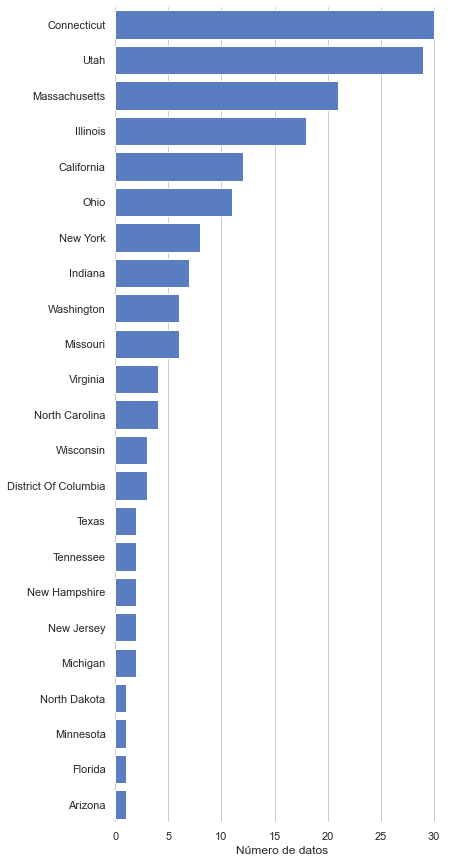

In [61]:
states=districts_df.groupby("state")#se agrupan los datos de distritos por "estado"

#gráfico

sns.set_theme(style="whitegrid")

# Se inicia la figura
f, ax = plt.subplots(figsize=(6, 15))

# Se grafican la cantidad de datos
sns.set_color_codes("muted")
sns.barplot(x="district_id", y="state", data=states.count().reset_index().sort_values("district_id", ascending=False),label="Total", color="b")

# se añaden las leyendas
ax.set(ylabel="",
       xlabel="Número de datos")
sns.despine(left=True, bottom=True)

Se observa una gran cantidad de datos en estados como Conecticut, Utah y Massachussetss, sin embargo esta cantidad disminuye notablemente en los demás estados, llegando a estados como Arizona que sólo tienen 1 dato.
Esto llama notoriamente la atención, pues uno nota que el database districts_df tiene 233 filas, por lo que faltan datos, por esto se analizará cuántos datos son NAN:

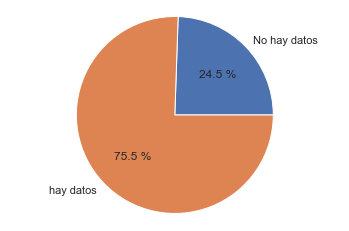

In [62]:
states_NAN=districts_df.isnull().sum()["state"]
[states_NAN,states["district_id"].sum()]

#grafico círcular

plt.pie([states_NAN,states.count()["district_id"].sum()], labels=["No hay datos","hay datos"], autopct="%0.1f %%") #se solicitan los datos que ya están almacenados en la variable "nombres"
plt.axis("equal")
plt.show()

Se observa que el 25% de los datos son NAN, por lo que algunos distritos sólo estarán representados por 1 colegio.

Se analizará el panorama en el año 2020, una forma de hacerlo es comprobar cuáles fueron las funciones escenciales más usadas en el 2020: 

[Text(0, 0.5, ''), Text(0.5, 0, 'Número de datos')]

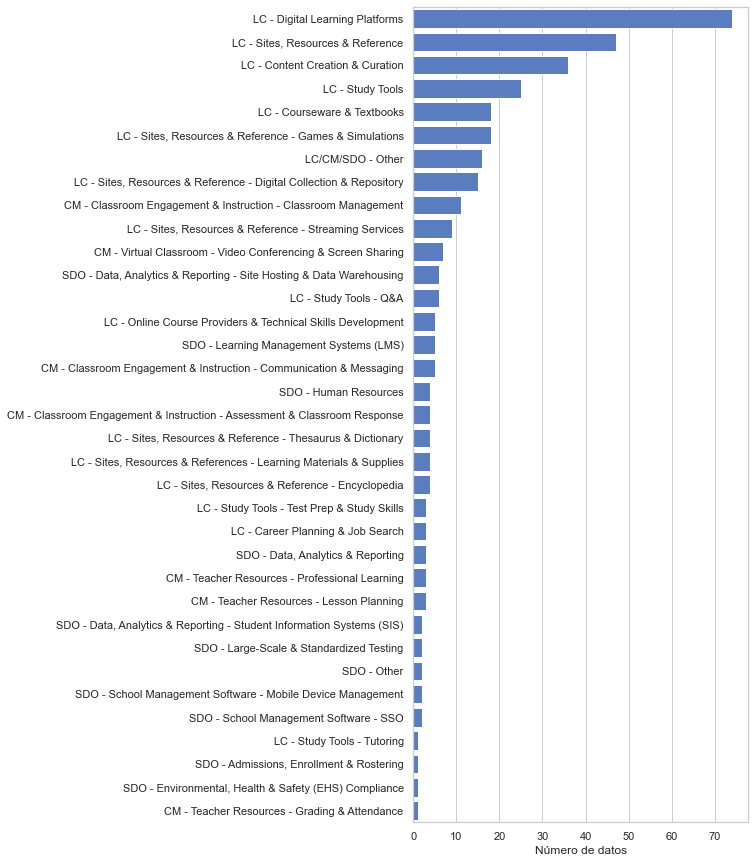

In [63]:
primary=products_df.groupby("primary_essential_function")


#gráfico

sns.set_theme(style="whitegrid")

# Se inicia la figura
f, ax = plt.subplots(figsize=(6, 15))

# Se grafican la cantidad de datos
sns.set_color_codes("muted")
sns.barplot(x="provider/company_name", y="primary_essential_function", data=primary.count().reset_index().sort_values("provider/company_name", ascending=False),label="Total", color="b")

# se añaden las leyendas
ax.set(ylabel="",
       xlabel="Número de datos")


Se observa un notorio uso de la categoría "LC - Digital Learning Platforms", lo cual viene a significar plataformas digitales de aprendizaje, en otras palabras, clases online. El panorama encontrado, en general, hace entender que gran parte de los usuarios tuvo clases online. Otra categoría encontrada con un alto uso es la "LC - Sites, Resources & Reference" que podría entenderse como sitios para buscar información o referencias, esto se entiende como que hubo una alta demanda de acceso a la información en sitios online, podríamos entenderlo como búsqueda personal de información.

Un punto interesante también, es notar que las páginas dedicadas a profesores sopn poco visitadas con respecto a las que están dedicadas a alumnos, esto tiene 2 formas de entenderse:

1.- Son más alumnos que profesores, por lo que es normal que hayan mas personas utilizando páginas dedicadas a alumnos.

2.- Los profesores pueden tener mayores dificultades que los alumnos para el acceso a la tecnología, no desde el punto de vista de la herramiento, pero desde el punto de vista de la habilidad con la misma.


Para entender el uso que se le dio a las páginas educativas, se graficará el uso promedio de páginas por cada 100k estudiantes:

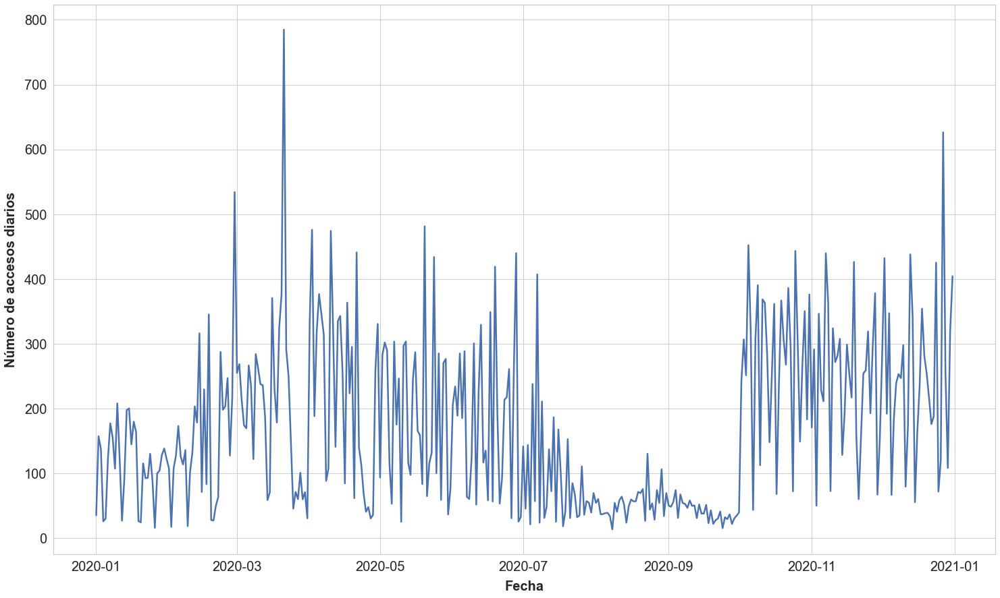

In [64]:
engagement_df['time2'] = pd.to_datetime(df['time'], format = '%Y-%m-%d'); #se transforman las fechas (string) a formato fecha, para poder graficarlas bien
tiempo=engagement_df.groupby("time2").mean()["engagement_index"]; #se obtiene el promedio de los usos de las páginas, agrupadas por fecha

#se crea el gráfico
f, ax = plt.subplots(figsize=(25, 15));
sns.set_theme(style="whitegrid");

plt.xticks(fontsize=20);
plt.yticks(fontsize=20);
sns.lineplot(data=tiempo, linewidth=2.5)
sns.cubehelix_palette(start=1, rot=-.5, as_cmap=True)
# se añaden las leyendas

ax.set_xlabel("Fecha", fontsize=20, labelpad=10, fontweight='bold');
ax.set_ylabel("Número de accesos diarios", fontsize=20, labelpad=10, fontweight='bold');

Es posible notar que antes de marzo de 2020 el uso de estos recursos educacionales no era tan elevado, sin embargo, a partir de marzo los usos aumentan considerablemente, esto concuerda con el estallido de COVID-19 en el mundo, por lo que en ese momento muchos establecimientos cambiaron a modalidad online. Se observa na bajada por el mes de julio, y hasta septiembre, esto concuerda con el periodo de vacaciones en estados unidos.

Entrando al segundo semestre se observa un uso constante de las páginas, se entiende que esto es porque los colegios ya se han adaptado a las clases online y probablemente todos los colegios estén con modalidad online.

In [65]:
#igualo los tipos de datos en districts_df y engagement_df
districts_df["district_id"]=districts_df["district_id"].astype(int)  
engagement_df["district_id"]=engagement_df["district_id"].astype(int)


datos_totales=pd.merge(districts_df,engagement_df,on=["district_id"],how="outer")#genero una base de datos mezclando los datos de los alumnos con los distritos

distr=datos_totales.groupby(["state","time"]).mean().reset_index() #agrupo los datos por tiempo y estado

distr[["time2"]]=pd.to_datetime(distr['time'], format = '%Y-%m-%d'); #se transforman las fechas (string) a formato fecha, para poder graficarlas bien


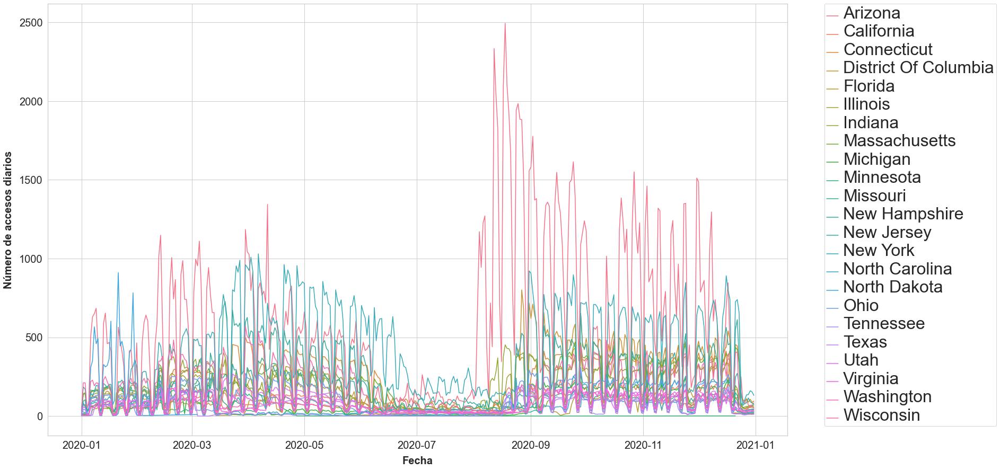

In [66]:
#se crea el gráfico
f, ax = plt.subplots(figsize=(25, 15)); #se crea el gráfico
sns.set_theme(style="whitegrid");

plt.xticks(fontsize=20);
plt.yticks(fontsize=20);

sns.lineplot(
    x="time2",
    y="engagement_index",
    hue='state',# color por estado
    data=distr,
    ci = None,

) #se grafican los datos de accesos en el tiempo, clasificados por estado

# se añaden y configuran las leyendas
sns.cubehelix_palette(start=1, rot=-.5, as_cmap=True)
ax.set_xlabel("Fecha", fontsize=20, labelpad=10, fontweight='bold');
ax.set_ylabel("Número de accesos diarios", fontsize=20, labelpad=10, fontweight='bold');
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.setp(ax.get_legend().get_texts(), fontsize='32'); 

Se observa que, en general, todos los estados tienen el mismo comportamiento, sin embargo, se obtiene que el estado de arizona tiene un número de acceso considerablemente mayor que los demás estados. No tengo el conocimiento específico, pero puede deberse a que en ese estado las restricciones contra el covid fueron mas estrictas, y en el segundo semestre (mas o menos desde 2020-08) todo fue online, mientras que en los otros estados no fue tan restrictivo.


Ahora para entender el tipo de accesibilidad que tienen en distintas zonas de un estado, dígase ciudad o pueblo, entre otros, se graficara el promedio nacional de accesos desde esta subdivisión (`locale`)

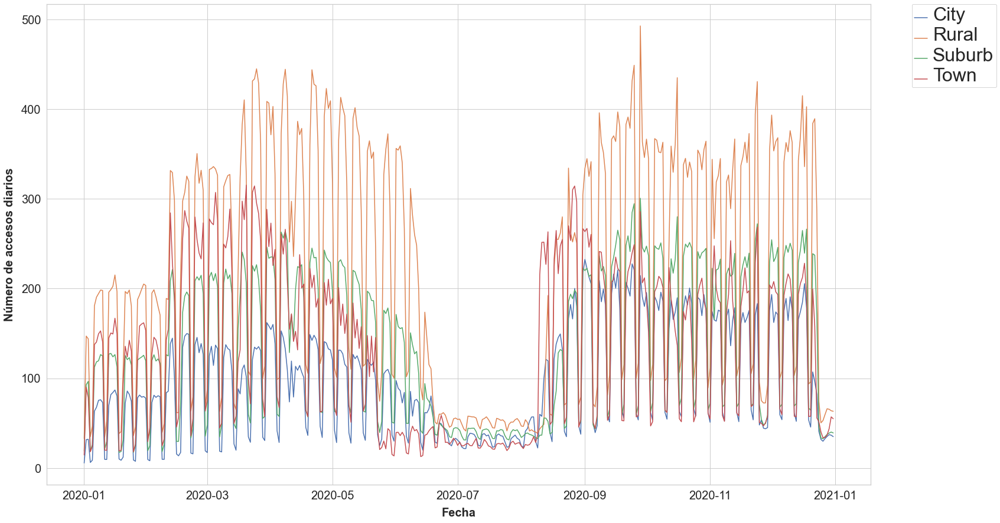

In [67]:
local=datos_totales.groupby(["locale","time"]).mean().reset_index() #agrupo los datos por tiempo y localía
local[["time2"]]=pd.to_datetime(local['time'], format = '%Y-%m-%d'); #se transforman las fechas (string) a formato fecha, para poder graficarlas bien

#se crea el gráfico
f, ax = plt.subplots(figsize=(25, 15)); #se crea el gráfico
sns.set_theme(style="whitegrid");

plt.xticks(fontsize=20);
plt.yticks(fontsize=20);

sns.lineplot(
    x="time2",
    y="engagement_index",
    hue='locale',# color por estado
    data=local,
    ci = None,

) #se grafican los datos de accesos en el tiempo, clasificados por estado

# se añaden y configuran las leyendas
sns.cubehelix_palette(start=1, rot=-.5, as_cmap=True)
ax.set_xlabel("Fecha", fontsize=20, labelpad=10, fontweight='bold');
ax.set_ylabel("Número de accesos diarios", fontsize=20, labelpad=10, fontweight='bold');
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.setp(ax.get_legend().get_texts(), fontsize='32'); 

Es posible notar que los accesos en ciudad en el primer semestre son considerablemente menores que en las demás categorías, esto puede deberse a que muchos colegios en ciudades siguieron teniendo clases presenciales, sin embargo, en el segundo semestre aumentan, como se ha visto en los gráficos anteriores. También se nota que los accesos en áreas rurales es el más utilizado, esto puede deberse a que muchos estudiantes de áreas rurales prefieren clases online, pues no deben trasladarse a sus lugares de estudios (muchos en las ciudades).

Se observa que en suburbios y pueblos el comportamiento es bastante similar (entre ellos), y es mayor que en ciudad pero menor que en áreas rurales.

__CONCLUSIONES__: se observa que en las zonas rurales es donde más se utilizaron los recursos computacionales y que en el primer semestre hubo un aumento progresivo, sin embargo, a partir del segundo semestre se observa un uso constante de recursos computacionales.